In [1]:
using Pkg; Pkg.activate(".")

  Activating environment at `~/Documents/Coding/julia/manning/proj1/proj1b/Project.toml`


In [2]:
Pkg.add(["DataFrames", "CSV", "Plots", "StatsPlots", "FreqTables", "Arrow", "DataFramesMeta"])

    Updating registry at `~/.julia/registries/General`
   Resolving package versions...
  No Changes to `~/Documents/Coding/julia/manning/proj1/proj1b/Project.toml`
  No Changes to `~/Documents/Coding/julia/manning/proj1/proj1b/Manifest.toml`


In [3]:
using DataFrames, CSV, SHA, Downloads, FreqTables, Arrow, StatsPlots, Plots, DataFramesMeta

In [4]:
fnames = [
    "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data",
    "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names",
]

2-element Vector{String}:
 "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data"
 "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names"

In [5]:
files = map(fnames) do fname
    if !isfile(basename(fname))
        Downloads.download(fname, basename(fname))
    else
        basename(fname)
    end
end

2-element Vector{String}:
 "adult.data"
 "adult.names"

In [6]:
sha = [0xee, 0x86, 0xbb, 0xe5, 0x56,
0x57, 0x8f, 0x70, 0x9a, 0xe0,
0xfd, 0x00, 0x2a, 0xc5, 0x8a,
0xc9, 0x37, 0x26, 0x48, 0x2f];

In [7]:
open(files[1]) do f
    @assert sha1(f) == sha
end

In [8]:
print(read(files[2], String))

| This data was extracted from the census bureau database found at
| http://www.census.gov/ftp/pub/DES/www/welcome.html
| Donor: Ronny Kohavi and Barry Becker,
|        Data Mining and Visualization
|        Silicon Graphics.
|        e-mail: ronnyk@sgi.com for questions.
| Split into train-test using MLC++ GenCVFiles (2/3, 1/3 random).
| 48842 instances, mix of continuous and discrete    (train=32561, test=16281)
| 45222 if instances with unknown values are removed (train=30162, test=15060)
| Duplicate or conflicting instances : 6
| Class probabilities for adult.all file
| Probability for the label '>50K'  : 23.93% / 24.78% (without unknowns)
| Probability for the label '<=50K' : 76.07% / 75.22% (without unknowns)
|
| Extraction was done by Barry Becker from the 1994 Census database.  A set of
|   reasonably clean records was extracted using the following conditions:
|   ((AAGE>16) && (AGI>100) && (AFNLWGT>1)&& (HRSWK>0))
|
| Prediction task is to determine whether a person makes over

In [9]:
cols = [
    :age,
    :workclass,
    :fnlwgt,
    :education,
    :education_num,
    :marital_status,
    :occupation,
    :relationship,
    :race,
    :sex,
    :capital_gain,
    :capital_loss,
    :hours_per_week,
    :native_country,
    :target
];

In [10]:
df = CSV.read(files[1], DataFrame, header=cols, delim=", ", missingstring="?");
first(df, 5)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation
,Int64,String?,Int64,String,Int64,String,String?
1,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical
2,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial
3,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners
4,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners
5,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty


In [11]:
ENV["COLUMNS"] = 200
ENV["LINES"] = 80;

In [12]:
first(df, 5)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,target
,Int64,String?,Int64,String,Int64,String,String?,String,String,String,Int64,Int64,Int64,String?,String
1,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
2,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
3,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
4,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
5,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [13]:
select!(df, Not(:fnlwgt));

In [14]:
des = describe(df)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,age,38.5816,17,37.0,90,0,Int64
2,workclass,,Federal-gov,,Without-pay,1836,"Union{Missing, String}"
3,education,,10th,,Some-college,0,String
4,education_num,10.0807,1,10.0,16,0,Int64
5,marital_status,,Divorced,,Widowed,0,String
6,occupation,,Adm-clerical,,Transport-moving,1843,"Union{Missing, String}"
7,relationship,,Husband,,Wife,0,String
8,race,,Amer-Indian-Eskimo,,White,0,String
9,sex,,Female,,Male,0,String


In [15]:
categoricals = des[String .<: des.eltype, :variable]

9-element Vector{Symbol}:
 :workclass
 :education
 :marital_status
 :occupation
 :relationship
 :race
 :sex
 :native_country
 :target

In [16]:
mbar(nv, name) = bar(nv, yticks=(1:length(nv), names(nv)[1]), orientation=:h, title=name)

mbar (generic function with 1 method)

In [17]:
ft1 = freqtable(df, categoricals[1])

9-element Named Vector{Int64}
workclass        │ 
─────────────────┼──────
Federal-gov      │   960
Local-gov        │  2093
Never-worked     │     7
Private          │ 22696
Self-emp-inc     │  1116
Self-emp-not-inc │  2541
State-gov        │  1298
Without-pay      │    14
missing          │  1836

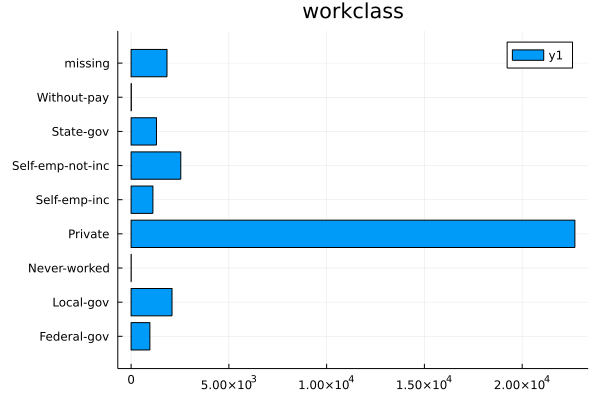

In [18]:
mbar(ft1, categoricals[1])

In [19]:
ft2 = freqtable(df, categoricals[2])

16-element Named Vector{Int64}
education    │ 
─────────────┼──────
10th         │   933
11th         │  1175
12th         │   433
1st-4th      │   168
5th-6th      │   333
7th-8th      │   646
9th          │   514
Assoc-acdm   │  1067
Assoc-voc    │  1382
Bachelors    │  5355
Doctorate    │   413
HS-grad      │ 10501
Masters      │  1723
Preschool    │    51
Prof-school  │   576
Some-college │  7291

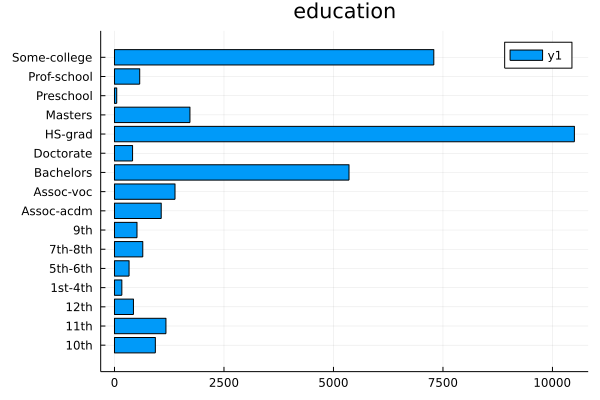

In [20]:
mbar(ft2, categoricals[2])

In [21]:
ft3 = freqtable(df, categoricals[3])

7-element Named Vector{Int64}
marital_status        │ 
──────────────────────┼──────
Divorced              │  4443
Married-AF-spouse     │    23
Married-civ-spouse    │ 14976
Married-spouse-absent │   418
Never-married         │ 10683
Separated             │  1025
Widowed               │   993

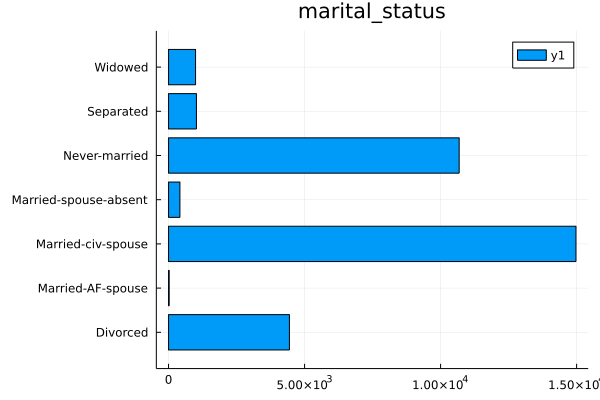

In [22]:
mbar(ft3, categoricals[3])

In [23]:
ft4 = freqtable(df, categoricals[4])

15-element Named Vector{Int64}
occupation        │ 
──────────────────┼─────
Adm-clerical      │ 3770
Armed-Forces      │    9
Craft-repair      │ 4099
Exec-managerial   │ 4066
Farming-fishing   │  994
Handlers-cleaners │ 1370
Machine-op-inspct │ 2002
Other-service     │ 3295
Priv-house-serv   │  149
Prof-specialty    │ 4140
Protective-serv   │  649
Sales             │ 3650
Tech-support      │  928
Transport-moving  │ 1597
missing           │ 1843

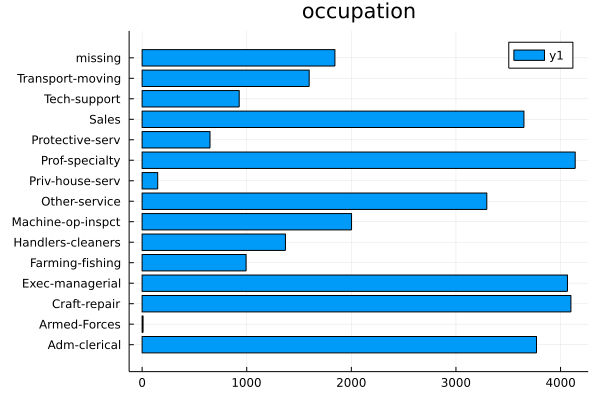

In [24]:
mbar(ft4, categoricals[4])

In [25]:
ft5 = freqtable(df, categoricals[5])

6-element Named Vector{Int64}
relationship   │ 
───────────────┼──────
Husband        │ 13193
Not-in-family  │  8305
Other-relative │   981
Own-child      │  5068
Unmarried      │  3446
Wife           │  1568

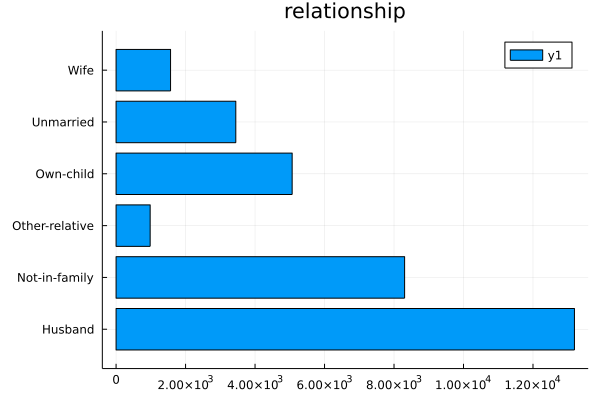

In [26]:
mbar(ft5, categoricals[5])

In [27]:
ft6 = freqtable(df, categoricals[6])

5-element Named Vector{Int64}
race               │ 
───────────────────┼──────
Amer-Indian-Eskimo │   311
Asian-Pac-Islander │  1039
Black              │  3124
Other              │   271
White              │ 27816

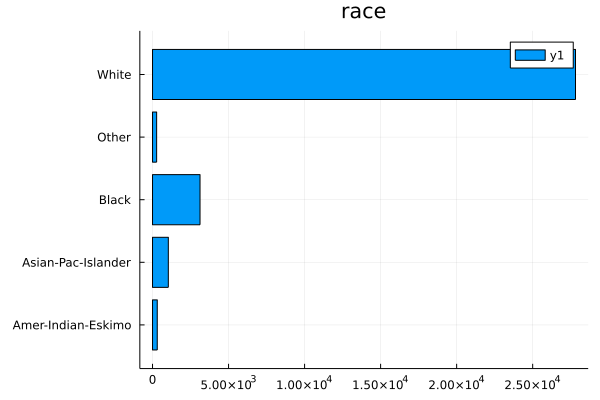

In [28]:
mbar(ft6, categoricals[6])

In [29]:
ft7 = freqtable(df, categoricals[7])

2-element Named Vector{Int64}
sex    │ 
───────┼──────
Female │ 10771
Male   │ 21790

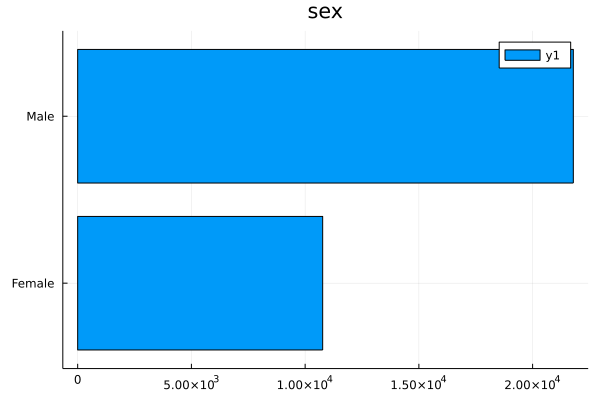

In [30]:
mbar(ft7, categoricals[7])

In [31]:
ft8 = freqtable(df, categoricals[8])

42-element Named Vector{Int64}
native_country             │ 
───────────────────────────┼──────
Cambodia                   │    19
Canada                     │   121
China                      │    75
Columbia                   │    59
Cuba                       │    95
Dominican-Republic         │    70
Ecuador                    │    28
El-Salvador                │   106
England                    │    90
France                     │    29
Germany                    │   137
Greece                     │    29
Guatemala                  │    64
Haiti                      │    44
Holand-Netherlands         │     1
Honduras                   │    13
Hong                       │    20
Hungary                    │    13
India                      │   100
Iran                       │    43
Ireland                    │    24
Italy                      │    73
Jamaica                    │    81
Japan                      │    62
Laos                       │    18
Mexico                     │ 

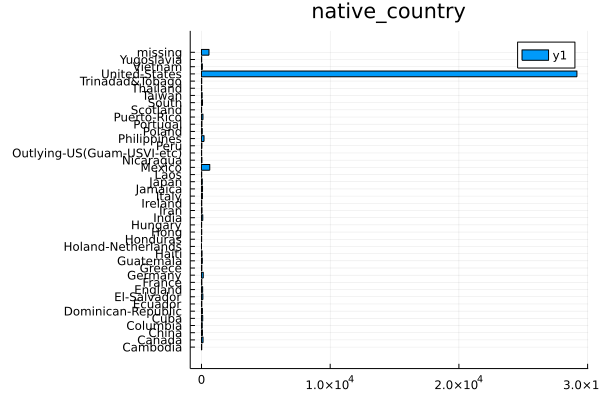

In [32]:
mbar(ft8, categoricals[8])

In [33]:
ft9 = freqtable(df, categoricals[9])

2-element Named Vector{Int64}
target  │ 
────────┼──────
<=50K   │ 24720
>50K    │  7841

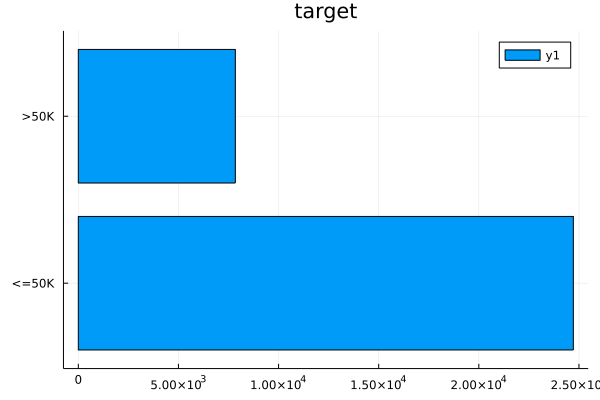

In [34]:
mbar(ft9, categoricals[9])

In [35]:
@transform! df @byrow @passmissing :native_country = ifelse(:native_country == "United-States", "United-States", "not-United-States");

In [36]:
freqtable(df, :marital_status, :relationship)

7×6 Named Matrix{Int64}
marital_status ╲ relationship │        Husband   Not-in-family  Other-relative       Own-child       Unmarried            Wife
──────────────────────────────┼───────────────────────────────────────────────────────────────────────────────────────────────
Divorced                      │              0            2404             110             328            1601               0
Married-AF-spouse             │              9               0               1               1               0              12
Married-civ-spouse            │          13184              17             124              95               0            1556
Married-spouse-absent         │              0             211              32              45             130               0
Never-married                 │              0            4706             611            4485             881               0
Separated                     │              0             420              55         

From this table we can see that we have overrepresentation of meried males when compared to total sex ratio.
These variables are also highly corelated, we know that if someone is Husband/Wife, they will be Married-civ-spouse.

In [37]:
categoricals

9-element Vector{Symbol}:
 :workclass
 :education
 :marital_status
 :occupation
 :relationship
 :race
 :sex
 :native_country
 :target

In [38]:
continues = [col for col in propertynames(df) if !(col in categoricals)]

5-element Vector{Symbol}:
 :age
 :education_num
 :capital_gain
 :capital_loss
 :hours_per_week

In [39]:
hists = Dict([s => histogram(df[!, s], title=s) for s in continues])

Dict{Symbol, Plots.Plot{Plots.GRBackend}} with 5 entries:
  :age            => Plot{Plots.GRBackend() n=1}
  :capital_loss   => Plot{Plots.GRBackend() n=1}
  :hours_per_week => Plot{Plots.GRBackend() n=1}
  :education_num  => Plot{Plots.GRBackend() n=1}
  :capital_gain   => Plot{Plots.GRBackend() n=1}

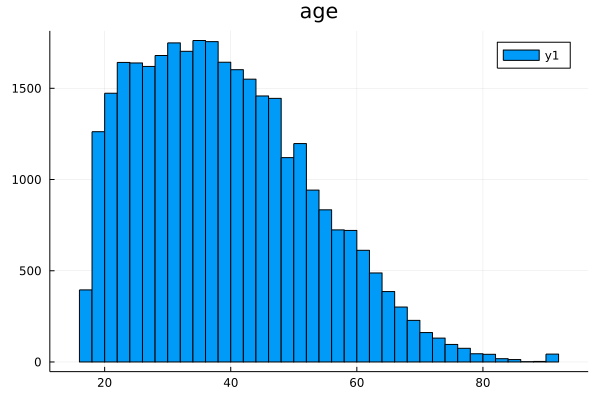

In [40]:
hists[continues[1]]

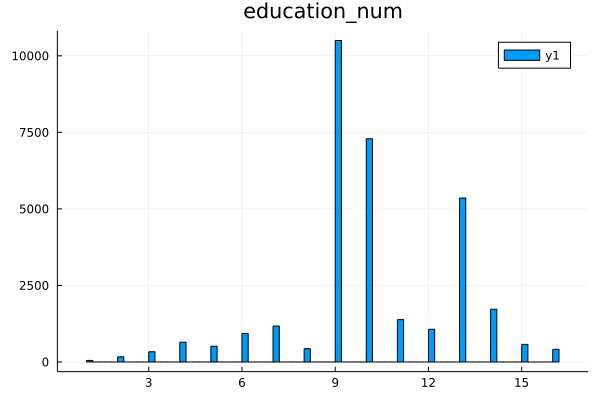

In [41]:
hists[continues[2]]

In [42]:
hists[continues[3]]

In [43]:

hists[continues[4]]

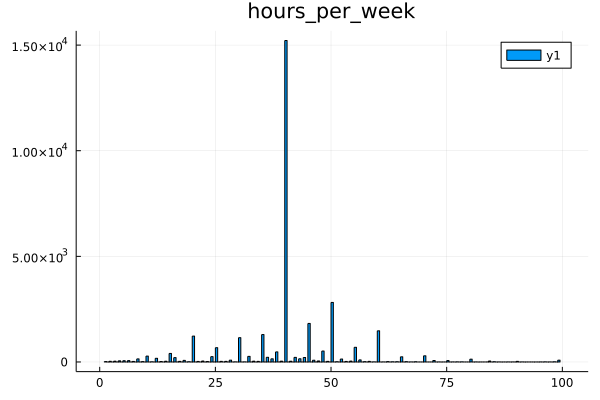

In [44]:
hists[continues[5]]

In [45]:
using Statistics

In [46]:
mean(df[!,:capital_loss] .== 0)

0.9533490986149074

In [47]:
mean(df[!,:capital_gain] .== 0)

0.9167101747489328

In [48]:
combine(groupby(df, :target), :capital_loss => x -> mean( x.== 0), :capital_gain => x -> mean( x.== 0))

,target,capital_loss_function,capital_gain_function
,String,Float64,Float64
1,<=50K,0.969822,0.958131
2,>50K,0.901416,0.786124


We can deduce that there is much higher probability of earning over 50k is highly corelated with having higher cash flow and especially lower probability of zero capital gain, not a rocket science, but an important insight :)

In [50]:
Arrow.write("res_adult.arrow", df)

"res_adult.arrow"